Epoch:   200 	 Cost:    0.1792 	 W: 0.433 	 b:-0.4869
Epoch:   400 	 Cost:    0.1399 	 W:0.3939 	 b:-0.2096
Epoch:   600 	 Cost:    0.1157 	 W:0.3632 	 b:0.00786
Epoch:   800 	 Cost:    0.1008 	 W:0.3391 	 b:0.1784
Epoch:  1000 	 Cost:   0.09158 	 W:0.3203 	 b:0.3122
Epoch:  1200 	 Cost:   0.08594 	 W:0.3055 	 b:0.4172
Epoch:  1400 	 Cost:   0.08248 	 W:0.2939 	 b:0.4995
Epoch:  1600 	 Cost:   0.08034 	 W:0.2848 	 b: 0.564
Epoch:  1800 	 Cost:   0.07903 	 W:0.2776 	 b:0.6147
Epoch:  2000 	 Cost:   0.07822 	 W: 0.272 	 b:0.6544
Optimization Finished!
Final training cost: 0.07822015 W: 0.27200785 b: 0.6543664 



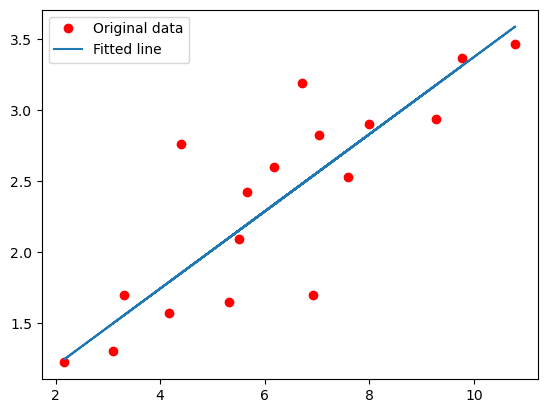

Final testing cost: 0.07558222
Absolute mean square loss difference: 0.0026379302


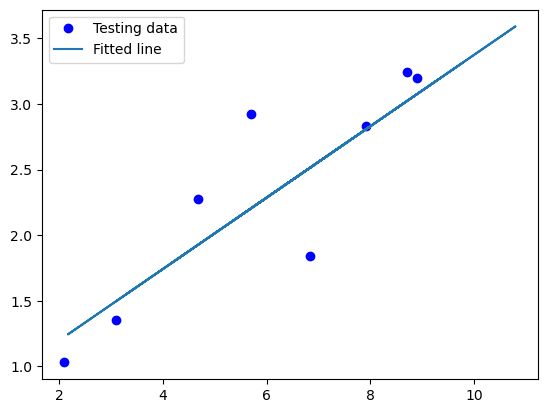

In [53]:
# 2
# importing the d, giải thích ependencies
import tensorflow.compat.v1 as tf
import numpy as np
import matplotlib.pyplot as plt
tf.compat.v1.disable_eager_execution()
# Model Parameters
learning_rate = 0.01
training_epochs = 2000
display_step = 200

# Training Data
train_X = np.asarray([3.3,4.4,5.5,6.71,6.93,4.168,9.779,6.182,7.59,2.167,7.042,10.791,5.313,7.997,5.654,9.27,3.1])
train_y = np.asarray([1.7,2.76,2.09,3.19,1.694,1.573,3.366,2.596,2.53,1.221,2.827,3.465,1.65,2.904,2.42,2.94,1.3])
n_samples = train_X.shape[0]

# Test Data
test_X = np.asarray([6.83, 4.668, 8.9, 7.91, 5.7, 8.7, 3.1, 2.1])

# Set placeholders for feature and target vectors
X = tf.placeholder(tf.float32)
y = tf.placeholder(tf.float32)

# Set model weights and bias)
test_y = np.asarray([1.84, 2.273, 3.2, 2.831, 2.92, 3.24, 1.35, 1.03])
W = tf.Variable(np.random.randn(), name="weight")
b = tf.Variable(np.random.randn(), name="bias")

# Construct a linear model
linear_model = W*X + b

# Mean squared error
cost = tf.reduce_sum(tf.square(linear_model - y)) / (2*n_samples)

# Gradient descent
optimizer = tf.train.GradientDescentOptimizer(learning_rate).minimize(cost)

# Initializing the variables
init = tf.global_variables_initializer()

# Launch the graph
with tf.Session() as sess:
 # Load initialized variables in current session
    sess.run(init)
# Fit all training data
    for epoch in range(training_epochs):
# perform gradient descent step
        sess.run(optimizer, feed_dict={X: train_X, y: train_y})
# Display logs per epoch step
        if (epoch+1) % display_step == 0: 
            c = sess.run(cost, feed_dict={X: train_X, y: train_y})
            print("Epoch:{0:6} \t Cost:{1:10.4} \t W:{2:6.4} \t b:{3:6.4}".format(epoch+1, c, sess.run(W), sess.run(b)))
# Print final parameter values
    print("Optimization Finished!")
    training_cost = sess.run(cost, feed_dict={X: train_X, y: train_y})
    print("Final training cost:", training_cost, "W:", sess.run(W), "b:", sess.run(b), '\n')
 
 # Graphic display
    plt.plot(train_X, train_y, 'ro', label='Original data')
    plt.plot(train_X, sess.run(W) * train_X + sess.run(b), label='Fitted line')
    plt.legend()
    plt.show()
 
 # Testing the model
    testing_cost = sess.run(tf.reduce_sum(tf.square(linear_model - y)) / (2 * test_X.shape[0]),
    feed_dict={X: test_X, y: test_y})
 
    print("Final testing cost:", testing_cost)
    print("Absolute mean square loss difference:", abs(training_cost - testing_cost))
 
    # Display fitted line on test data
    plt.plot(test_X, test_y, 'bo', label='Testing data')
    plt.plot(train_X, sess.run(W) * train_X + sess.run(b), label='Fitted line')
    plt.legend()
    plt.show()

In [1]:
# 4
import tensorflow as tf
import numpy as np
#print("TensorFlow version:", tf.__version__)
mnist = tf.keras.datasets.mnist # lấy dữ liệu từ bộ dữ liệu mnist
(x_train, y_train), (x_test, y_test) = mnist.load_data() # lấy dữ liệu train, test
x_train, x_test = x_train / 255.0, x_test / 255.0
model = tf.keras.models.Sequential([
 tf.keras.layers.Flatten(input_shape=(28, 28)), # ép lại dạng ma trận ảnh
 tf.keras.layers.Dense(128, activation='relu'), #với 128 đơn vị và hàm kích hoạt ReLU
 tf.keras.layers.Dropout(0.2),#với tỉ lệ dropout 0.2 để tránh overfitting
 tf.keras.layers.Dense(10) #10 đơn vị đầu ra để dự đoán lớp của các chữ số
])

predictions = model(x_train[:1])
predictions 

#Biên soạn mô hình để huấn luyện. 
#Sử dụng trình tối ưu hóa 'adam', hàm mất mát đã được xác định ở trước 
#và độ đo 'accuracy' để theo dõi hiệu suất mô hình.
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
loss_fn(y_train[:1], predictions)
model.compile(optimizer='adam',loss=loss_fn,metrics=['accuracy'])
#Huấn luyện mô hình trên tập huấn luyện (x_train và y_train) trong 5 epochs (vòng lặp qua toàn bộ tập dữ liệu huấn luyện). 
model.fit(x_train, y_train, epochs=5)
model.evaluate(x_test, y_test, verbose=2) # đánh giá

tf.Tensor(
[[ 0.66073656 -0.71173763 -0.35739222  0.22324511  0.01929869  0.26865014
   0.1500993   0.05099799 -0.06055491 -0.07236734]], shape=(1, 10), dtype=float32)
Epoch 1/5
1875/1875 [==============================] - 5s 3ms/step - loss: 0.2982 - accuracy: 0.9133
Epoch 2/5
1875/1875 [==============================] - 5s 2ms/step - loss: 0.1417 - accuracy: 0.9578
Epoch 3/5
1875/1875 [==============================] - 5s 3ms/step - loss: 0.1070 - accuracy: 0.9671
Epoch 4/5
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0864 - accuracy: 0.9738
Epoch 5/5
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0757 - accuracy: 0.9761
313/313 - 1s - loss: 0.0727 - accuracy: 0.9779 - 711ms/epoch - 2ms/step


[0.07272855937480927, 0.9779000282287598]

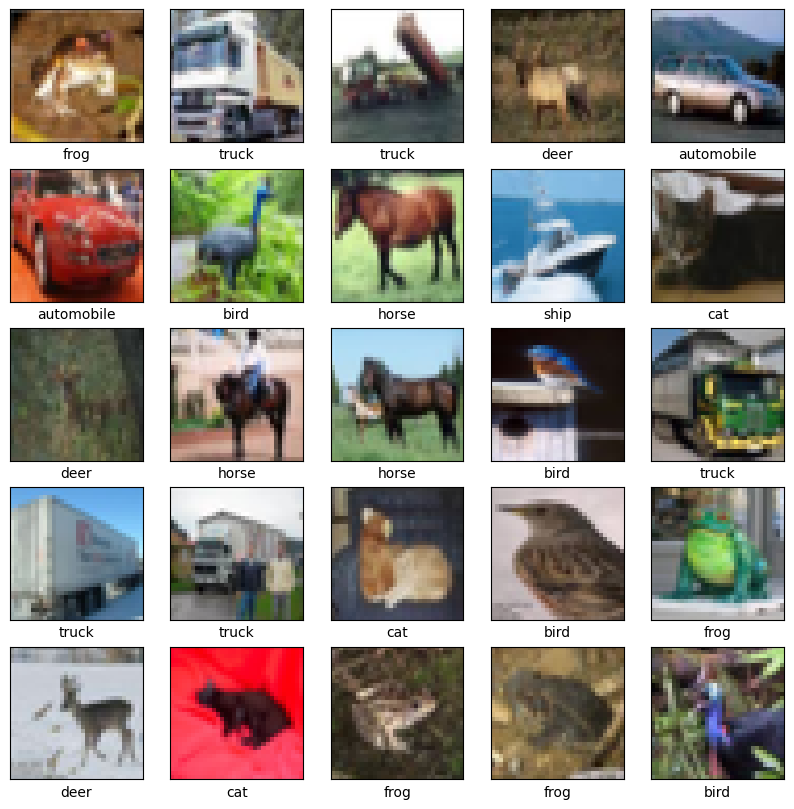

In [50]:
# 4
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt
# lấy dữ liệu train, test
(train_images, train_labels), (test_images, test_labels) = datasets.cifar10.load_data()

# Normalize pixel values to be between 0 and 1
train_images, test_images = train_images / 255.0, test_images / 255.0 
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', # để ánh xạ tên từ số về tên
 'dog', 'frog', 'horse', 'ship', 'truck']
plt.figure(figsize=(10,10)) # cấu hình kích thức mỗi ô 10x10
for i in range(25):
 plt.subplot(5,5,i+1) # bảng 5x5 ảnh 
 plt.xticks([]) # ẩn tọa độ x 
 plt.yticks([]) # ẩn tọa độ y
 plt.grid(False)
 plt.imshow(train_images[i]) # plt lấy ảnh train_images[i]
 # The CIFAR labels happen to be arrays, 
 # which is why you need the extra index
 plt.xlabel(class_names[train_labels[i][0]]) # lấy nhãn
plt.show()# hiển thị

2.13.0


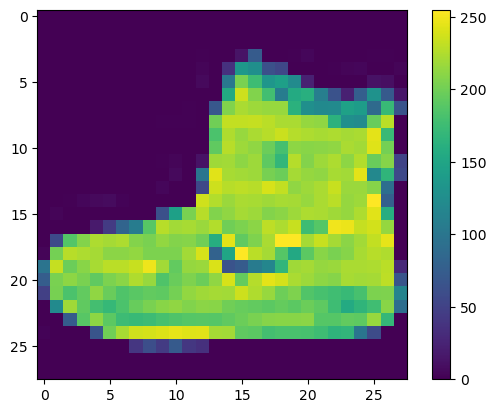

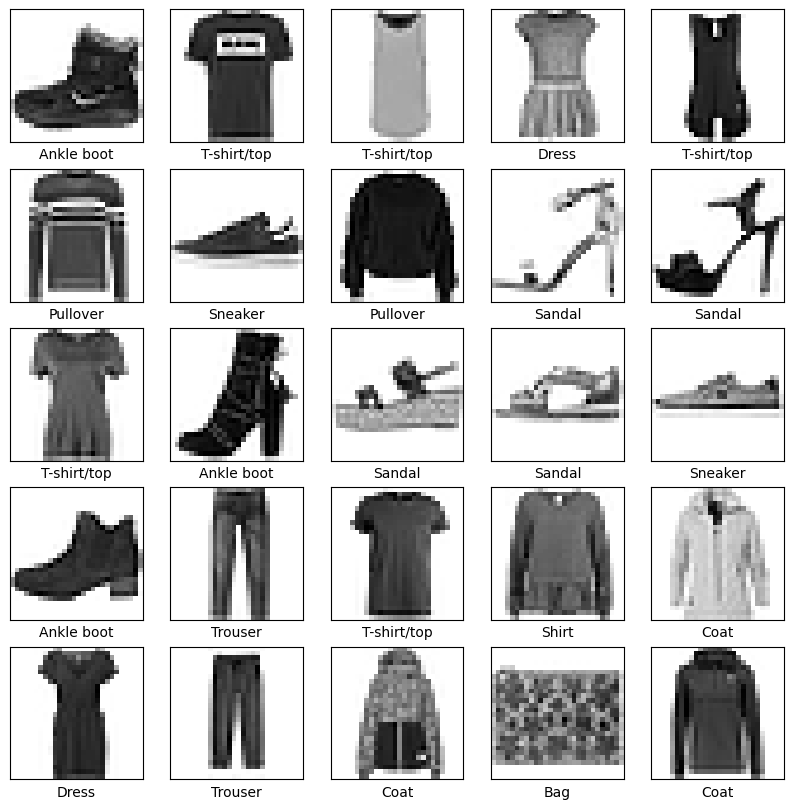

In [51]:
# 4
import tensorflow as tf
# Helper libraries
import numpy as np
import matplotlib.pyplot as plt
# print(tf.__version__)

fashion_mnist = tf.keras.datasets.fashion_mnist # lấy bộ dữ liệu
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data() # lấy tập dữ liệu train, test
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', # để ánh xạ tên từ số về tên
 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
train_images.shape  # hiện kích thức thước train_images

plt.figure() 
plt.imshow(train_images[0]) # plt lấy train_images[0]
plt.colorbar() # cột màu
plt.grid(False) # ẩn lưới (mặc định ẩn)
plt.show() # hiện train_images[0] 

train_images = train_images / 255.0
test_images = test_images / 255.0
plt.figure(figsize=(10,10)) # cấu hình mỗi ô kích thước 10x10
for i in range(25):
 plt.subplot(5,5,i+1) # bảng 5x5 ảnh
 plt.xticks([]) # ẩn tọa độ x 
 plt.yticks([]) # ẩn tọa độ x
 plt.grid(False)
 plt.imshow(train_images[i], cmap=plt.cm.binary) # hiện thị ảnh, cài đen trắng(plt.cm.binary)
 plt.xlabel(class_names[train_labels[i]])# đặt tên cho ảnh
plt.show() # hiện thị


dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


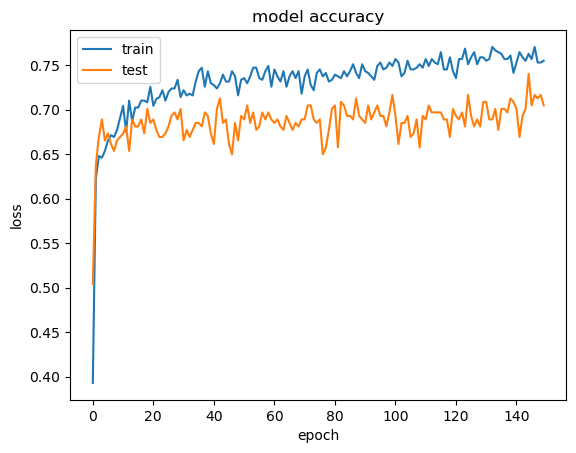

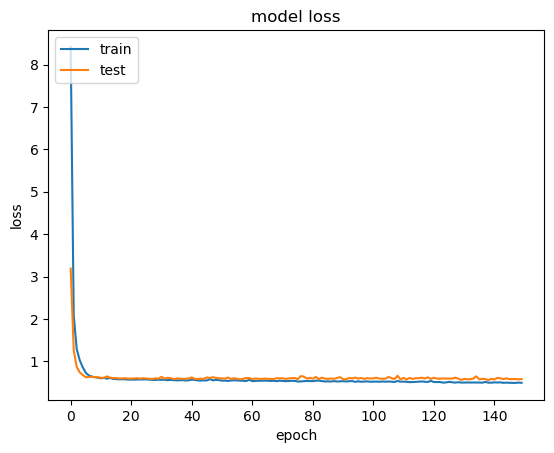

In [2]:
# 6
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import matplotlib.pyplot as plt
import numpy as np

# load pima indians dataset
dataset = np.loadtxt("pima-indians-diabetes.csv", delimiter=",")
# split into input (X) and output (Y) variables
X = dataset[:,0:8] # lấy đối tượng huấn luyện
Y = dataset[:,8] # lấy nhãn

# create model
model = Sequential() # mô hình tuần tự
model.add(Dense(12, input_dim=8, activation='relu')) #Thêm một lớp Dense có 12 nơ-ron, 
# nhận đầu vào là một vector có kích thước 8, và sử dụng hàm kích hoạt relu
model.add(Dense(8, activation='relu')) #Thêm một lớp Dense có 8 nơ-ron, nhận đầu vào là đầu ra của lớp trước,
# và sử dụng hàm kích hoạt relu
model.add(Dense(1, activation='sigmoid')) #Thêm một lớp Dense có 1 nơ-ron, nhận đầu vào là đầu ra của lớp trước,
# và sử dụng hàm kích hoạt sigmoid.

# Compile model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
#Hàm mất mát: binary_crossentropy, Thuật toán tối ưu hóa: adam, chỉ số đánh giá: accuracy
# Fit the model
history = model.fit(X, Y, validation_split=0.33, epochs=150, batch_size=10, verbose=0) # tạo đối tượng history,
# tách 33% dữ liệu từ dữ liệ huấn luyện để xác thực, lặp lại 150 qua toàn bộ dữ liệu, Kích thước của mỗi batch 10,
# chế độ không hiển thị quá trình huấn luyện.
# list all data in history
print(history.history.keys()) # in ra các khóa của từ điển.

# summarize history for accuracy
plt.plot(history.history['accuracy']) #Vẽ đường biểu diễn độ chính xác của mô hình trên tập huấn luyện theo từng epoch
plt.plot(history.history['val_accuracy'])# Vẽ đường biểu diễn độ chính xác của mô hình trên tập kiểm định theo từng epoch(màu cam)
plt.title('model accuracy') # đặt tiêu đề model accuracy
plt.ylabel('loss') # nhãn trục y
plt.xlabel('epoch') # nhãn trục x
plt.legend(['train', 'test'], loc='upper left') # tên cho đường biểu diễn đặt góc trên bên trái
plt.show()

# summarize history for loss
plt.plot(history.history['loss']) # Vẽ đường biểu diễn độ sai lệch của mô hình trên tập huấn luyện theo từng epoch
plt.plot(history.history['val_loss'])# Vẽ đường biểu diễn độ sai lệch của mô hình trên tập kiểm định theo từng epoch
plt.title('model loss') # đặt tiêu đề model loss
plt.ylabel('loss') # nhãn trục y
plt.xlabel('epoch') # nhãn trục x
plt.legend(['train', 'test'], loc='upper left') # tên cho đường biểu diễn đặt góc trên bên trái
plt.show()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 20, 8)             80000     
                                                                 
 flatten_1 (Flatten)         (None, 160)               0         
                                                                 
 dense_5 (Dense)             (None, 1)                 161       
                                                                 
Total params: 80161 (313.13 KB)
Trainable params: 80161 (313.13 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/10
625/625 [==============================] - 2s 2ms/step - loss: 0.6709 - acc: 0.6163 - val_loss: 0.6262 - val_acc: 0.6952
Epoch 2/10
625/625 [==============================] - 1s 2ms/step - loss: 0.5532 - acc: 0.7452 - val_loss: 0.5354 - val_acc: 0.7256
Epoch 3/10
625/6

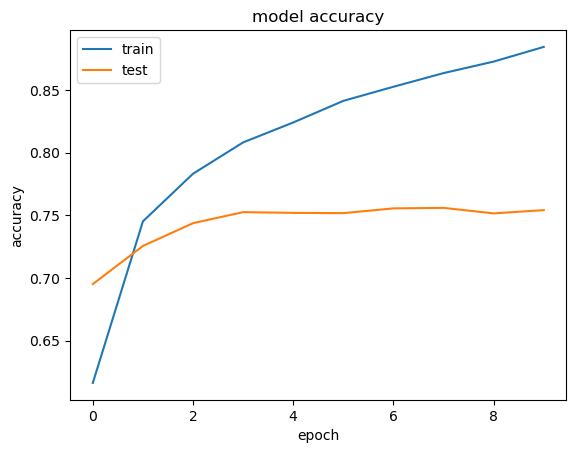

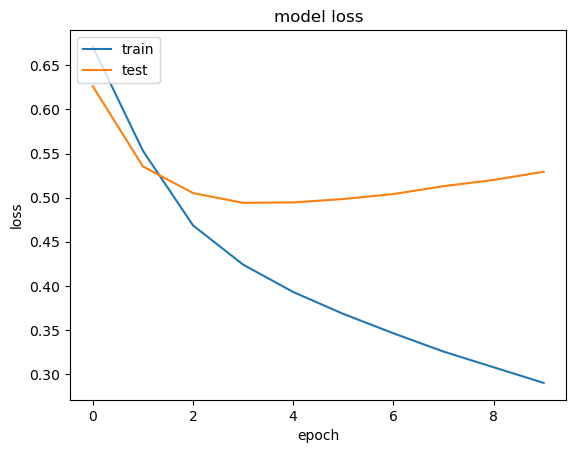

In [3]:
# 8
from keras.datasets import imdb
from keras import preprocessing
from keras.layers import Embedding
from keras.models import Sequential
from keras.layers import Flatten, Dense
import matplotlib.pyplot as plt
import numpy as np

max_features = 10000
maxlen = 20

(x_train, y_train), (x_test, y_test) = imdb.load_data(num_words=max_features) # lấy 10000 từ
x_train = preprocessing.sequence.pad_sequences(x_train, maxlen=maxlen) # làm các chuỗi có độ dài bằng nhau
x_test = preprocessing.sequence.pad_sequences(x_test, maxlen=maxlen) #làm các chuỗi có độ dài bằng nhau
model = Sequential() # mô hình tuần tự
model.add(Embedding(10000, 8, input_length=maxlen))
model.add(Flatten())
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['acc'])
model.summary() #hiển thị thông tin tổng quan về mô hình học sâu
history = model.fit(x_train, y_train,epochs=10,batch_size=32,validation_split=0.2) # tạo đối tượng history,
# tách 20% dữ liệu từ dữ liệ huấn luyện để xác thực, lặp lại 10 qua toàn bộ dữ liệu, Kích thước của mỗi batch 32,
# chế độ hiển thị quá trình huấn luyện.
plt.plot(history.history['acc']) #Vẽ đường biểu diễn độ chính xác của mô hình trên tập huấn luyện theo từng epoch
plt.plot(history.history['val_acc']) # Vẽ đường biểu diễn độ chính xác của mô hình trên tập kiểm định theo từng epoch
plt.title('model accuracy') # tiêu đề model accuracy
plt.ylabel('loss') # nhãn trục y
plt.xlabel('epoch') # nhãn trục x
plt.legend(['train', 'test'], loc='upper left') # tên cho đường biểu diễn đặt góc trên bên trái
plt.show()

plt.plot(history.history['loss']) # Vẽ đường biểu diễn độ sai lệch của mô hình trên tập huấn luyện theo từng epoch
plt.plot(history.history['val_loss']) # Vẽ đường biểu diễn độ sai lệch của mô hình trên tập kiểm định theo từng epoch
plt.title('model loss') # tiêu đề model loss
plt.ylabel('loss') # nhãn trục y
plt.xlabel('epoch') # nhãn trục x
plt.legend(['train', 'test'], loc='upper left') # tên cho đường biểu diễn đặt góc trên bên trái
plt.show()

In [ ]:
# 9

In [ ]:
# 10

In [1]:
# 11
from keras import layers
from keras import models
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(28, 28, 1)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))

from keras.datasets import mnist
from keras.utils import to_categorical
(train_images, train_labels), (test_images, test_labels) = mnist.load_data()
train_images = train_images.reshape((60000, 28, 28, 1))
train_images = train_images.astype('float32') / 255
test_images = test_images.reshape((10000, 28, 28, 1))
test_images = test_images.astype('float32') / 255
train_labels = to_categorical(train_labels)
test_labels = to_categorical(test_labels)
model.compile(optimizer='rmsprop',
loss='categorical_crossentropy',
metrics=['accuracy'])
model.fit(train_images, train_labels, epochs=5, batch_size=64)
test_loss, test_acc = model.evaluate(test_images, test_labels)
print(test_acc)

Epoch 1/5
938/938 [==============================] - 26s 27ms/step - loss: 0.1818 - accuracy: 0.9431
Epoch 2/5
938/938 [==============================] - 23s 24ms/step - loss: 0.0496 - accuracy: 0.9850
Epoch 3/5
938/938 [==============================] - 22s 24ms/step - loss: 0.0344 - accuracy: 0.9894
Epoch 4/5
938/938 [==============================] - 23s 24ms/step - loss: 0.0265 - accuracy: 0.9917
Epoch 5/5
938/938 [==============================] - 28s 29ms/step - loss: 0.0201 - accuracy: 0.9935


In [6]:
# 11
import os
import shutil
# # Đường dẫn đến thư mục nơi bộ dữ liệu gốc đã được giải nén
# original_dataset_dir = 'train'
# # Thư mục nơi bạn sẽ lưu trữ bộ dữ liệu nhỏ của mình
# base_dir = 'cats_and_dogs_small'
# os.mkdir(base_dir)

# # Các thư mục cho các phần tách huấn luyện, xác thực và kiểm thử
# train_dir = os.path.join(base_dir, 'train')
# os.mkdir(train_dir)
# validation_dir = os.path.join(base_dir, 'validation')
# os.mkdir(validation_dir)
# test_dir = os.path.join(base_dir, 'test')
# os.mkdir(test_dir)

# # Thư mục với hình ảnh mèo huấn luyện
# train_cats_dir = os.path.join(train_dir, 'cats')
# os.mkdir(train_cats_dir)
# # Thư mục với hình ảnh chó huấn luyện
# train_dogs_dir = os.path.join(train_dir, 'dogs')
# os.mkdir(train_dogs_dir)
# # Thư mục với hình ảnh mèo xác thực
# validation_cats_dir = os.path.join(validation_dir, 'cats')
# os.mkdir(validation_cats_dir)
# # Thư mục với hình ảnh chó xác thực
# validation_dogs_dir = os.path.join(validation_dir, 'dogs')
# os.mkdir(validation_dogs_dir)
# # Thư mục với hình ảnh mèo kiểm thử
# test_cats_dir = os.path.join(test_dir, 'cats')
# os.mkdir(test_cats_dir)
# # Thư mục với hình ảnh chó kiểm thử
# test_dogs_dir = os.path.join(test_dir, 'dogs')
# os.mkdir(test_dogs_dir)

# # Sao chép 1,000 hình ảnh mèo đầu tiên vào train_cats_dir
# fnames = ['cat.{}.jpg'.format(i) for i in range(1000)]
# for fname in fnames:
#     src = os.path.join(original_dataset_dir, fname)
#     dst = os.path.join(train_cats_dir, fname)
#     shutil.copyfile(src, dst)
# # Sao chép 500 hình ảnh mèo tiếp theo vào validation_cats_dir
# fnames = ['cat.{}.jpg'.format(i) for i in range(1000, 1500)]
# for fname in fnames:
#     src = os.path.join(original_dataset_dir, fname)
#     dst = os.path.join(validation_cats_dir, fname)
#     shutil.copyfile(src, dst)
# # Sao chép 500 hình ảnh mèo tiếp theo vào test_cats_dir
# fnames = ['cat.{}.jpg'.format(i) for i in range(1500, 2000)]
# for fname in fnames:
#     src = os.path.join(original_dataset_dir, fname)
#     dst = os.path.join(test_cats_dir, fname)
#     shutil.copyfile(src, dst)
# # Sao chép 1,000 hình ảnh chó đầu tiên vào train_dogs_dir
# fnames = ['dog.{}.jpg'.format(i) for i in range(1000)]
# for fname in fnames:
#     src = os.path.join(original_dataset_dir, fname)
#     dst = os.path.join(train_dogs_dir, fname)
#     shutil.copyfile(src, dst)
# # Sao chép 500 hình ảnh chó tiếp theo vào validation_dogs_dir
# fnames = ['dog.{}.jpg'.format(i) for i in range(1000, 1500)]
# for fname in fnames:
#     src = os.path.join(original_dataset_dir, fname)
#     dst = os.path.join(validation_dogs_dir, fname)
#     shutil.copyfile(src, dst)
# # Sao chép 500 hình ảnh chó tiếp theo vào test_dogs_dir
# fnames = ['dog.{}.jpg'.format(i) for i in range(1500, 2000)]
# for fname in fnames:
#     src = os.path.join(original_dataset_dir, fname)
#     dst = os.path.join(test_dogs_dir, fname)
#     shutil.copyfile(src, dst)

# Kiểm tra độ chính xác, đếm xem có bao nhiêu hình ảnh trong mỗi phần đào tạo (đào tạo/xác nhận/kiểm tra):
print('total training cat images:', len(os.listdir("C:/Users/huy/cats_and_dogs_small/train/cats")))
print('total training dog images:', len(os.listdir("C:/Users/huy/cats_and_dogs_small/train/dogs")))
print('total validation cat images:', len(os.listdir("C:/Users/huy/cats_and_dogs_small/validation/cats")))
print('total validation dog images:', len(os.listdir("C:/Users/huy/cats_and_dogs_small/validation/dogs")))
print('total test cat images:', len(os.listdir("C:/Users/huy/cats_and_dogs_small/test/cats")))
print('total test dog images:', len(os.listdir("C:/Users/huy/cats_and_dogs_small/test/dogs")))

total training cat images: 1000
total training dog images: 1000
total validation cat images: 500
total validation dog images: 500
total test cat images: 500
total test dog images: 500


In [8]:
from keras import layers
from keras import models

model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', 
                        input_shape=(150, 150, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

# Hãy xem kích thước của bản đồ tính năng thay đổi như thế nào theo từng lớp kế tiếp:
model.summary()
# Cấu hình mô hình đào tạo
from keras import optimizers
model.compile(loss='binary_crossentropy',
    optimizer=optimizers.RMSprop(learning_rate=1e-4),
    metrics=['acc'])
# 5.2.4 Sử dụng ImageDataGenerator để đọc hình ảnh từ thư mục

from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    "C:/Users/huy/cats_and_dogs_small/train",
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
    "C:/Users/huy/cats_and_dogs_small/validation",
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary')
# Đầu ra của một trong những trình tạo này: nó tạo ra các batch hình ảnh 150 × 150 RGB (hình dạng (20, 150, 150, 3)) 
# và nhãn nhị phân (hình dạng (20,)). Mỗi batch có 20 mẫu (batch size). Lưu ý rằng trình tạo tạo ra các batch này
# vô thời hạn: nó lặp lại vô tận các hình ảnh  trong thư mục đích. Vì lý do này, bạn cần ngắt vòng lặp tại một số điểm:
for data_batch, labels_batch in train_generator:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    break
# Sử dụng bộ sinh batch để đào tạo mô hình
history = model.fit_generator(
#     history = model.fit(

    train_generator,
    steps_per_epoch=100,
    epochs=30,
    validation_data=validation_generator,
    validation_steps=50)
# Saving the model
# model.save('cats_and_dogs_small_1.h5')

# Hiển thị đồ thị về sự mất mát và độ chính xác trong quá trình đào tạo.
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 74, 74, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 36, 36, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 17, 17, 128)      

C:\Users\huy\AppData\Local\Temp\ipykernel_10516\991648780.py:51: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


 73/100 [====================>.........] - ETA: 11s - loss: 0.6942 - acc: 0.5247

KeyboardInterrupt: 

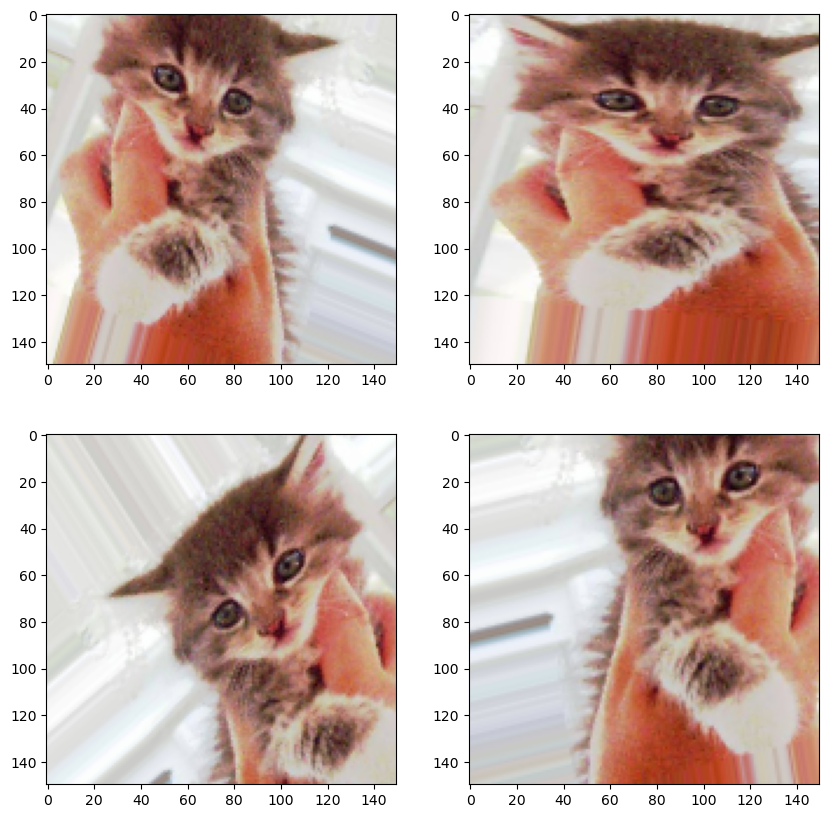

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


C:\Users\huy\AppData\Local\Temp\ipykernel_10516\2080725669.py:88: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


 10/100 [==>...........................] - ETA: 7:50 - loss: 0.6953 - acc: 0.4906

KeyboardInterrupt: 

In [12]:
# 5.2.5 Cấu hình tăng cường dữ liệu thông qua ImageDataGenerator.
from keras.preprocessing.image import ImageDataGenerator

# Tạo một đối tượng ImageDataGenerator và cấu hình nó với các biến đổi
datagen = ImageDataGenerator(
    rotation_range=40,  # Góc quay từ -40 đến 40 độ
    width_shift_range=0.2,  # Dịch chuyển theo chiều rộng tối đa 20% của chiều rộng ảnh
    height_shift_range=0.2,  # Dịch chuyển theo chiều cao tối đa 20% của chiều cao ảnh
    shear_range=0.2,  # Biến đổi cắt
    zoom_range=0.2,  # Biến đổi thu phóng
    horizontal_flip=True,  # Lật ngang
    fill_mode='nearest'  # Chế độ điền pixel gần nhất
)
# Hiển thị một số hình ảnh đào tạo được tăng cường một cách ngẫu nhiên.
#5.2.5
from keras.preprocessing import image
import os
import matplotlib.pyplot as plt
train_cats_dir="C:/Users/huy/cats_and_dogs_small/train/cats"
fnames = [os.path.join(train_cats_dir, fname) 
          for fname in os.listdir(train_cats_dir)]
img_path = fnames[3]
img = image.load_img(img_path, target_size=(150, 150))
x = image.img_to_array(img)
x = x.reshape((1,) + x.shape)

# Tạo một biểu đồ để hiển thị 4 biến thể dữ liệu
plt.figure(figsize=(10, 10))

i = 0
for batch in datagen.flow(x, batch_size=1):
    #plt.figure(i)
    plt.subplot(2, 2, i + 1)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break
plt.show()


# Xác định một mạng tích chập mới mà bao gồm lớp Dropout.
from keras import models
from keras import layers
from keras import optimizers

model = models.Sequential()
model.add(layers.Conv2D(256, (3, 3), activation='relu',
                        input_shape=(150, 150, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4),
              metrics=['acc'])
# Đào tạo mạng tích chập bằng cách sử dụng các bộ tạo tăng cường dữ liệu
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    "C:/Users/huy/cats_and_dogs_small/train",
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary')

    
validation_generator = test_datagen.flow_from_directory(
    "C:/Users/huy/cats_and_dogs_small/validation",
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary')

history = model.fit_generator(
    train_generator,
    steps_per_epoch=100,
    epochs=100
    validation_data=validation_generator,
    validation_steps=50)

# Saving the model
# model.save('cats_and_dogs_small_2.h5')
# Hiển thị đồ thị về sự mất mát và độ chính xác sau khi tăng cường dữ liệu.

import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()


(1, 150, 150, 3)


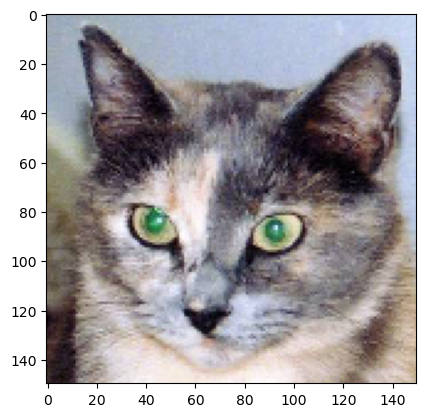

In [13]:
img_path = 'C:/Users/huy/cats_and_dogs_small/test/cats/cat.1700.jpg'
from keras.preprocessing import image
import numpy as np
img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.
print(img_tensor.shape)
import matplotlib.pyplot as plt
plt.imshow(img_tensor[0])
plt.show()


1/1 [==============================] - 0s 90ms/step


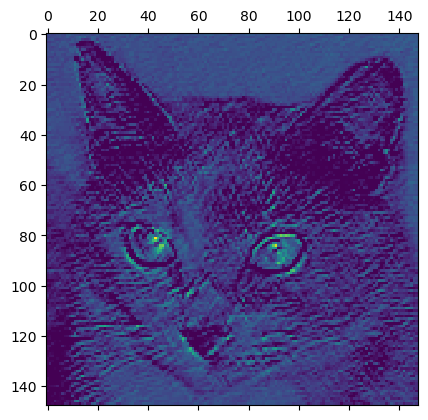

In [15]:
from keras import models
layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_tensor)
first_layer_activation = activations[0]
import matplotlib.pyplot as plt
plt.matshow(first_layer_activation[0, :, :, 4], cmap='viridis')

C:\Users\huy\AppData\Local\Temp\ipykernel_10516\2559784512.py:14: RuntimeWarning: invalid value encountered in divide
  channel_image /= channel_image.std()
C:\Users\huy\AppData\Local\Temp\ipykernel_10516\2559784512.py:17: RuntimeWarning: invalid value encountered in cast
  channel_image = np.clip(channel_image, 0, 255).astype('uint8')


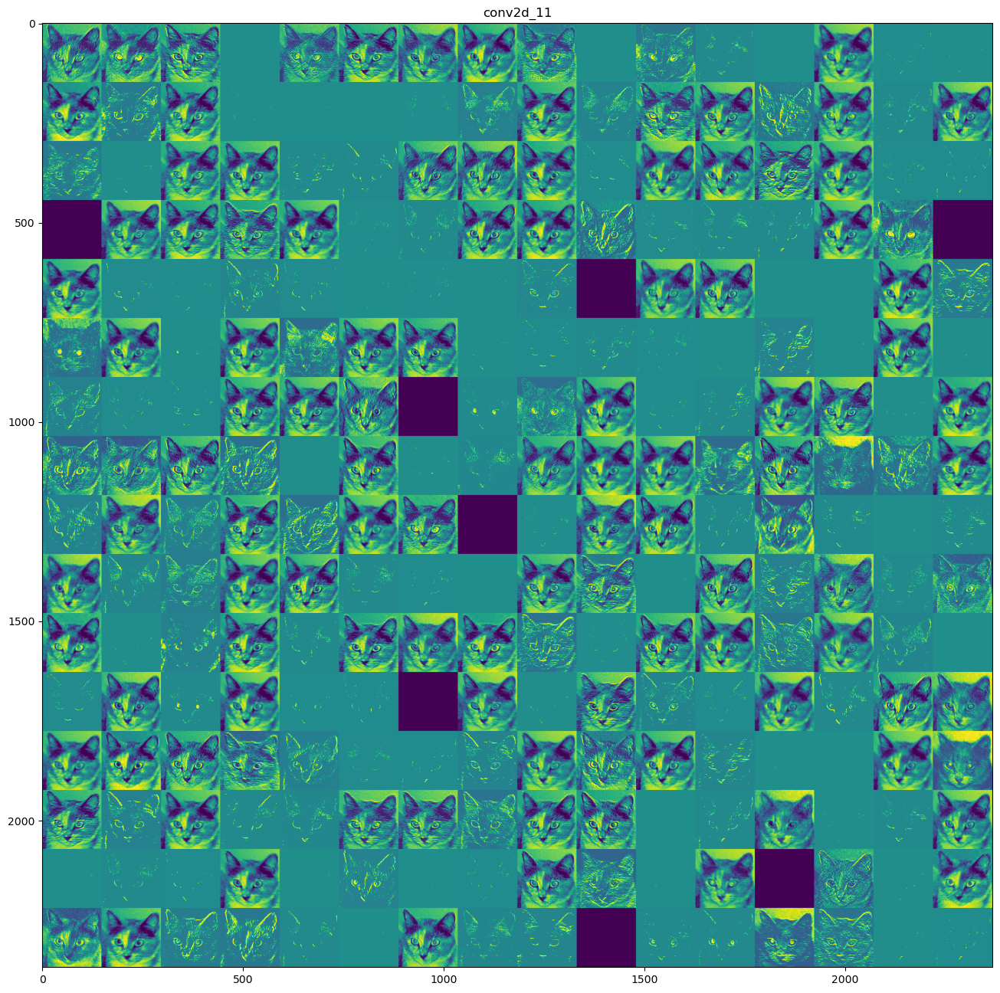

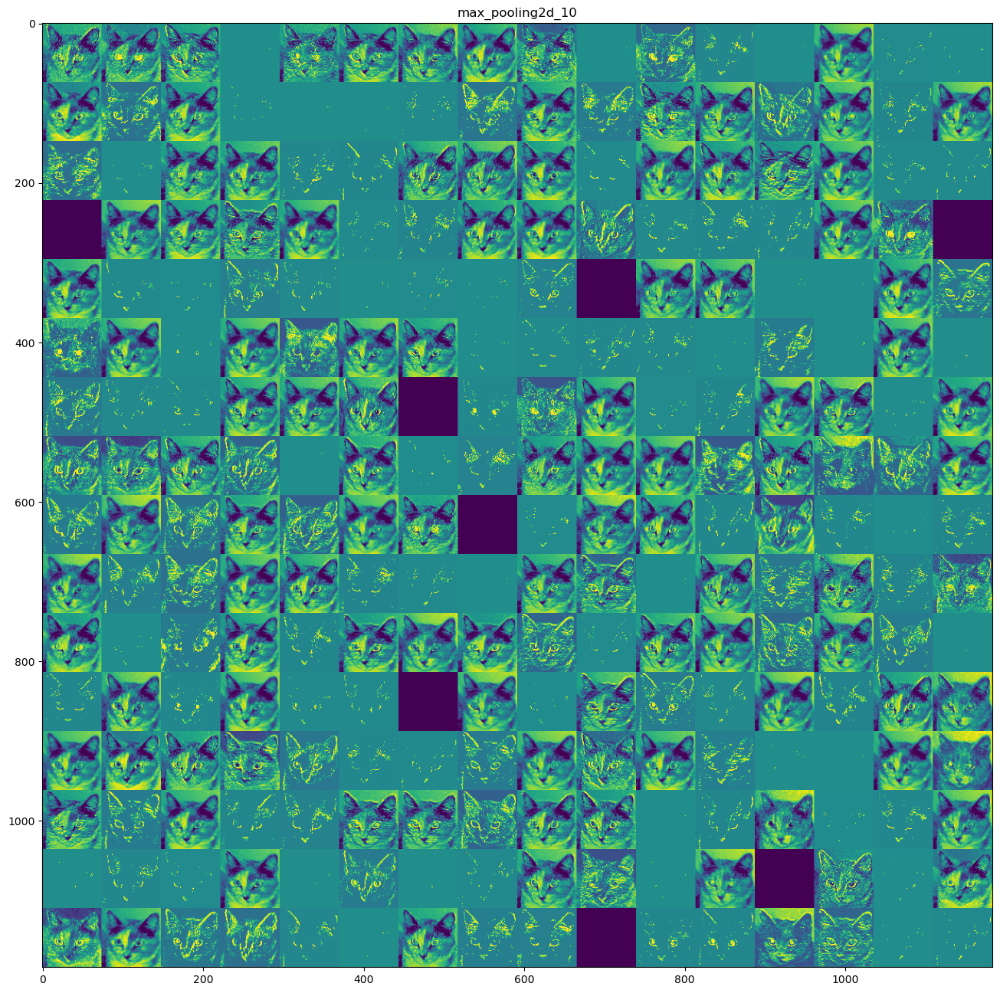

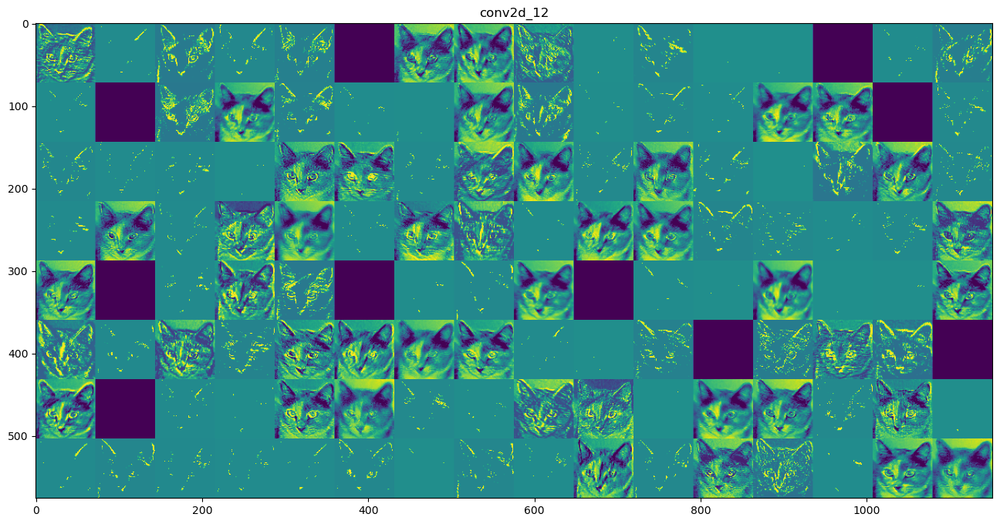

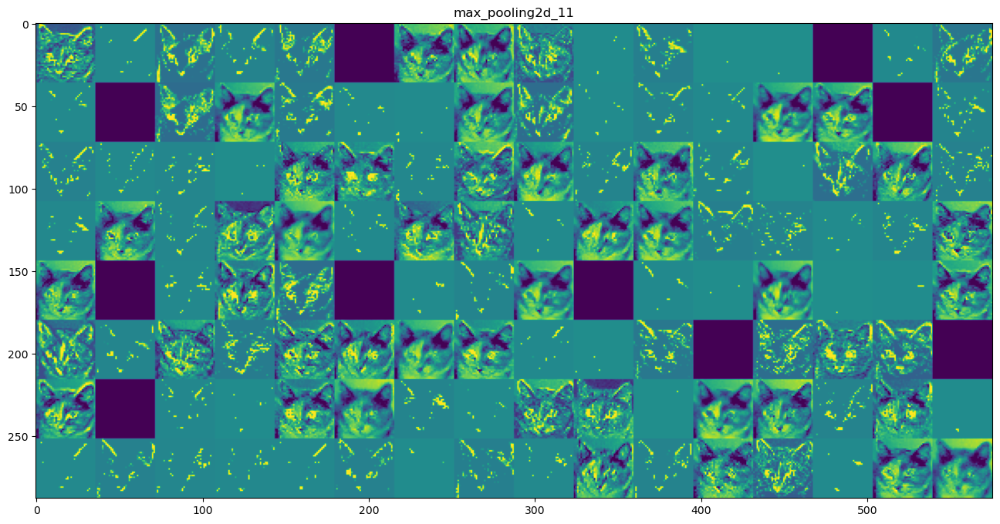

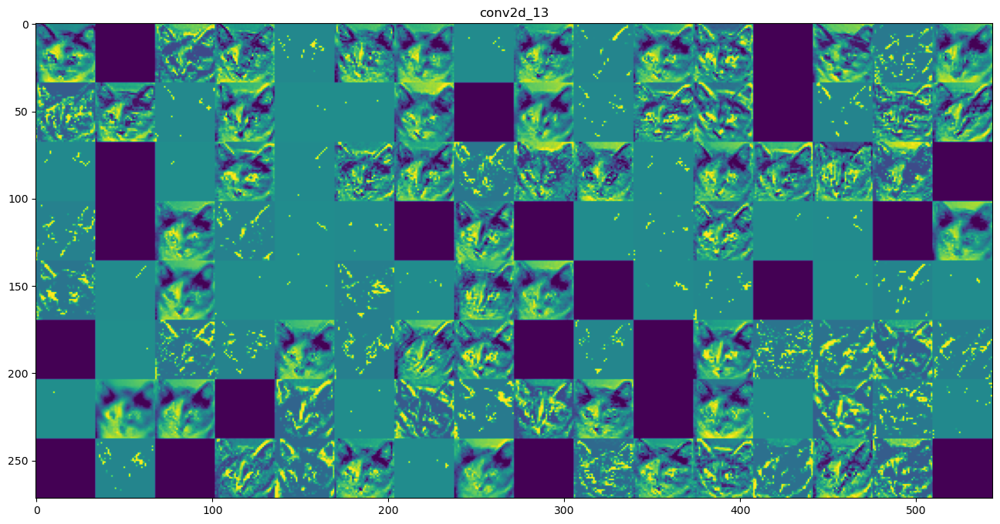

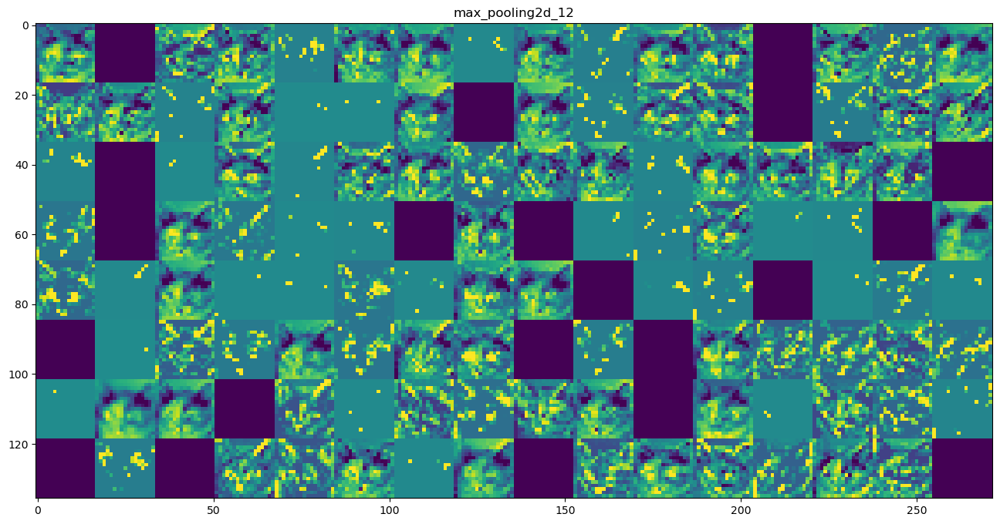

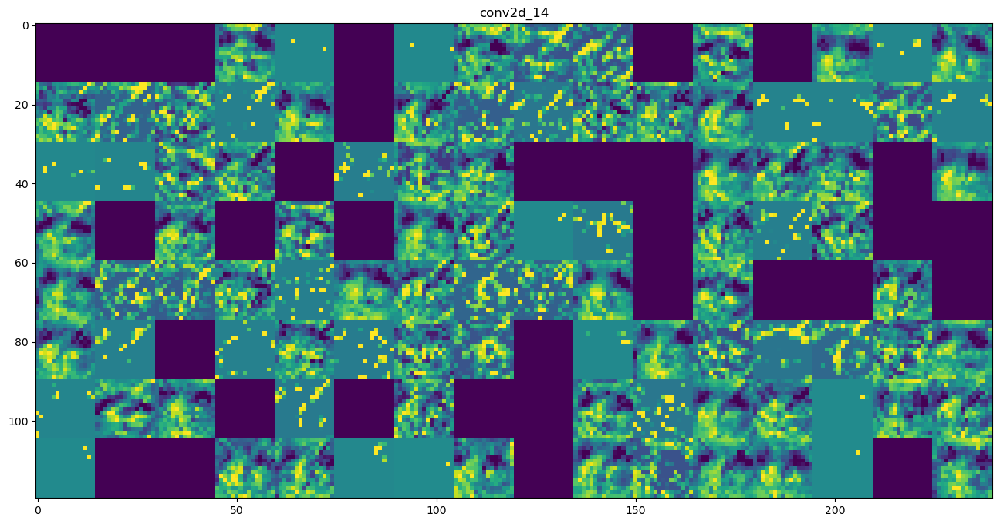

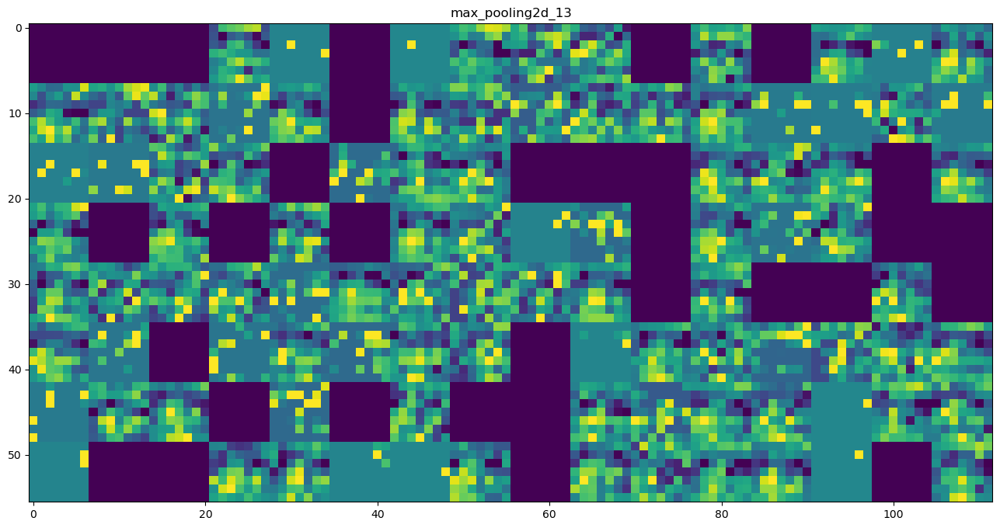

In [17]:
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,:, :, col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
            row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
    scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

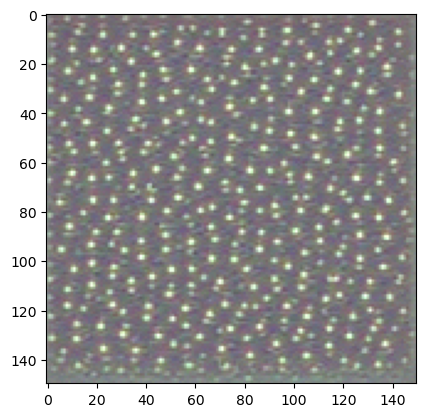

In [23]:
from keras.applications import VGG16
from keras import backend as K
import tensorflow as tf
tf.compat.v1.disable_eager_execution()
model = VGG16(weights='imagenet',
include_top=False)
layer_name = 'block3_conv1'
filter_index = 0
layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])
grads = K.gradients(loss, model.input)[0]
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
iterate = K.function([model.input], [loss, grads])

import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.
step = 1.
for i in range(40):
    loss_value, grads_value = iterate([input_img_data])
    input_img_data += grads_value * step
    
def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    x += 0.5
    x = np.clip(x, 0, 1)
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x
def generate_pattern(layer_name, filter_index, size=150):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])
    grads = K.gradients(loss, model.input)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
    iterate = K.function([model.input], [loss, grads])
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
    img = input_img_data[0]
    return deprocess_image(img)
plt.imshow(generate_pattern('block3_conv1', 0))

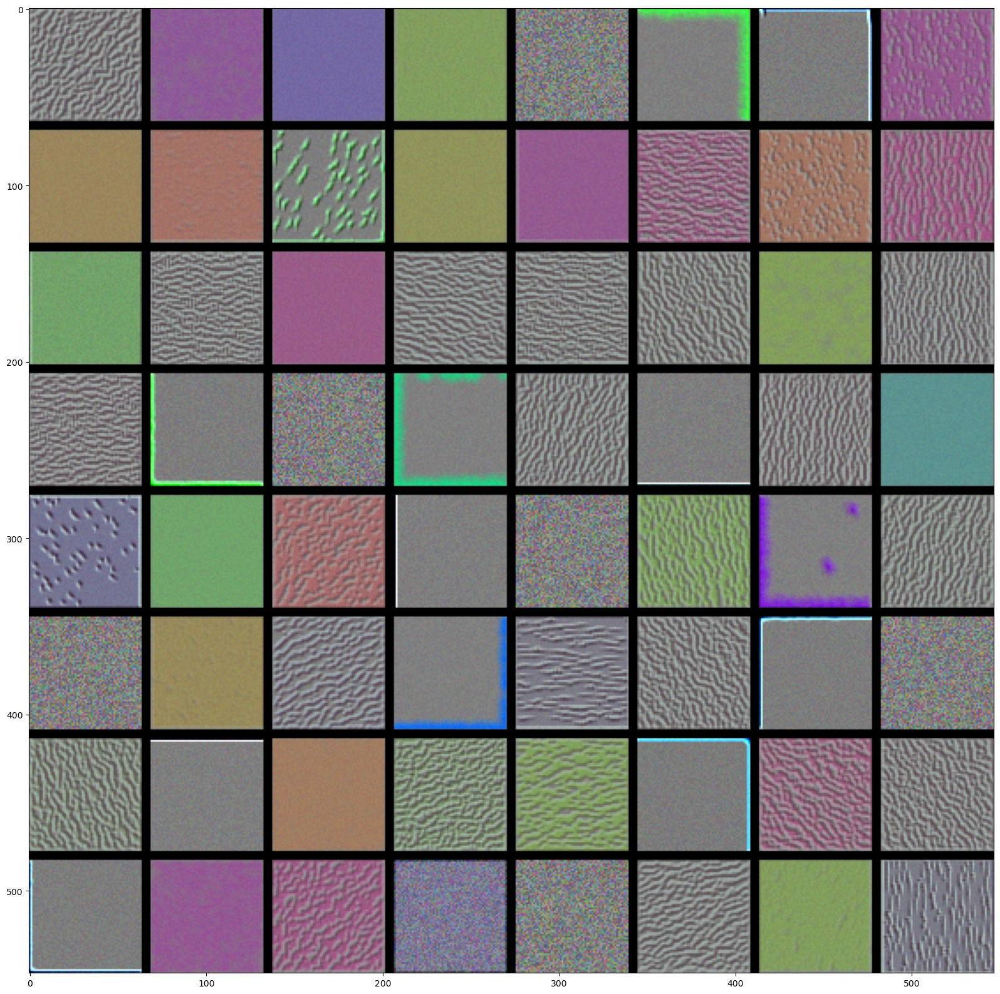

In [28]:
def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    x += 0.5
    x = np.clip(x, 0, 1)
    return x
layer_name = 'block1_conv1'
size = 64
margin = 5
results = np.zeros((8 * size+7* margin, 8 * size+7* margin, 3))
for i in range(8):
    for j in range(8):
        filter_img = generate_pattern(layer_name, i + (j * 8), size=size)
        filter_img = deprocess_image(filter_img)  # Áp dụng hàm deprocess_image
        horizontal_start = i * size + i * margin
        horizontal_end = horizontal_start + size
        vertical_start = j * size + j * margin
        vertical_end = vertical_start + size
        results[horizontal_start: horizontal_end,
                vertical_start: vertical_end, :] = filter_img
plt.figure(figsize=(20, 20))
plt.imshow(results)

In [30]:
from keras.applications.vgg16 import VGG16
model = VGG16(weights='imagenet')

from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions


553467096/553467096 [==============================] - 62s 0us/step


FileNotFoundError: [Errno 2] No such file or directory: 'C:/Users/huy/creative_commons_elephant.jpg'

In [33]:
import numpy as np
img_path = 'C:/Users/huy/creative_commons_elephant.jpg'
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)
preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])

Predicted: [('n02504458', 'African_elephant', 0.7948287), ('n01871265', 'tusker', 0.18198903), ('n02504013', 'Indian_elephant', 0.022466548)]


In [32]:
african_e66lephant_output = model.output[:, 386]
last_conv_layer = model.get_layer('block5_conv3')
grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]
pooled_grads = K.mean(grads, axis=(0, 1, 2))
iterate = K.function([model.input],
    [pooled_grads, last_conv_layer.output[0]])
pooled_grads_value, conv_layer_output_value = iterate([x])
for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
heatmap = np.mean(conv_layer_output_value, axis=-1)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
# import cv2
# img = cv2.imread(img_path)
# heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
# heatmap = np.uint8(255 * heatmap)
# heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
# superimposed_img = heatmap * 0.4 + img
# cv2.imwrite('C:/Users/huy/elephant_cam.jpg', superimposed_img)

NameError: name 'african_elephant_output' is not defined

In [ ]:
# 12
import numpy as np
samples = ['The cat sat on the mat.', 'The dog ate my homework.']
token_index = {}
for sample in samples:
    for word in sample.split():
        if word not in token_index:
            token_index[word] = len(token_index) + 1
max_length = 10
results = np.zeros(shape=(len(samples),max_length,max(token_index.values()) + 1))

for i, sample in enumerate(samples):
    for j, word in list(enumerate(sample.split()))[:max_length]:
        index = token_index.get(word)
        results[i, j, index] = 1.
        

In [ ]:
import string
samples = ['The cat sat on the mat.', 'The dog ate my homework.']
characters = string.printable
token_index = dict(zip(range(1, len(characters) + 1), characters))
max_length = 50
results = np.zeros((len(samples), max_length, max(token_index.keys()) + 1))
for i, sample in enumerate(samples):
    for j, character in enumerate(sample):
        index = token_index.get(character)
        results[i, j, index] = 1.


In [ ]:
from keras.preprocessing.text import Tokenizer
samples = ['The cat sat on the mat.', 'The dog ate my homework.']
tokenizer = Tokenizer(num_words=1000)
tokenizer.fit_on_texts(samples)
sequences = tokenizer.texts_to_sequences(samples)
one_hot_results = tokenizer.texts_to_matrix(samples, mode='binary')
word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))

samples = ['The cat sat on the mat.', 'The dog ate my homework.']
dimensionality = 1000
max_length = 10
results = np.zeros((len(samples), max_length, dimensionality))
for i, sample in enumerate(samples):
    for j, word in list(enumerate(sample.split()))[:max_length]:
        index = abs(hash(word)) % dimensionality
        results[i, j, index] = 1.

In [2]:
from keras.layers import Embedding
embedding_layer = Embedding(1000, 64)
from keras.datasets import imdb
from keras import preprocessing
max_features = 10000
maxlen = 20
(x_train, y_train), (x_test, y_test) = imdb.load_data(num_words=max_features)
x_train = preprocessing.sequence.pad_sequences(x_train, maxlen=maxlen)
x_test = preprocessing.sequence.pad_sequences(x_test, maxlen=maxlen)
                                               
from keras.models import Sequential
from keras.layers import Flatten, Dense
model = Sequential()
model.add(Embedding(10000, 8, input_length=maxlen))
model.add(Flatten())
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['acc'])
model.summary()
history = model.fit(x_train, y_train,epochs=10,batch_size=32,validation_split=0.2)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 20, 8)             80000     
                                                                 
 flatten (Flatten)           (None, 160)               0         
                                                                 
 dense (Dense)               (None, 1)                 161       
                                                                 
Total params: 80161 (313.13 KB)
Trainable params: 80161 (313.13 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/10
625/625 [==============================] - 2s 3ms/step - loss: 0.6591 - acc: 0.6442 - val_loss: 0.6016 - val_acc: 0.7016
Epoch 2/10
625/625 [==============================] - 1s 2ms/step - loss: 0.5292 - acc: 0.7520 - val_loss: 0.5213 - val_acc: 0.7344
Epoch 3/10
625/625

In [12]:
import os

imdb_dir = "C:/Users/huy/Downloads/aclImdb/aclImdb"
train_dir = os.path.join(imdb_dir, 'test')

labels = []
texts = []

for label_type in ['neg', 'pos']:
    dir_name = os.path.join(train_dir, label_type)
    for fname in os.listdir(dir_name):
        if fname[-4:] == '.txt':
            with open(os.path.join(dir_name, fname), 'r', encoding='utf-8') as f:
                texts.append(f.read())
            if label_type == 'neg':
                labels.append(0)
            else:
                labels.append(1)
                

In [13]:
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
import numpy as np

maxlen = 100  # We will cut reviews after 100 words
training_samples = 200  # We will be training on 200 samples
validation_samples = 10000  # We will be validating on 10000 samples
max_words = 10000  # We will only consider the top 10,000 words in the dataset

tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(texts)
sequences = tokenizer.texts_to_sequences(texts)

word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))

data = pad_sequences(sequences, maxlen=maxlen)

labels = np.asarray(labels)
print('Shape of data tensor:', data.shape)
print('Shape of label tensor:', labels.shape)

# Split the data into a training set and a validation set
# But first, shuffle the data, since we started from data
# where sample are ordered (all negative first, then all positive).
indices = np.arange(data.shape[0])
np.random.shuffle(indices)
data = data[indices]
labels = labels[indices]

x_train = data[:training_samples]
y_train = labels[:training_samples]
x_val = data[training_samples: training_samples + validation_samples]
y_val = labels[training_samples: training_samples + validation_samples]


Found 72633 unique tokens.
Shape of data tensor: (17243, 100)
Shape of label tensor: (17243,)


In [16]:
glove_dir = 'C:/Users/huy/Downloads/glove.6B'

embeddings_index = {}
with open(os.path.join(glove_dir, 'glove.6B.100d.txt'), 'r', encoding='utf-8') as f:
    for line in f:
        values = line.split()
        word = values[0]
        coefs = np.asarray(values[1:], dtype='float32')
        embeddings_index[word] = coefs

print('Found %s word vectors.' % len(embeddings_index))

Found 400001 word vectors.


In [17]:
embedding_dim = 100

embedding_matrix = np.zeros((max_words, embedding_dim))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if i < max_words:
        if embedding_vector is not None:
            # Words not found in embedding index will be all-zeros.
            embedding_matrix[i] = embedding_vector

In [18]:
from keras.models import Sequential
from keras.layers import Embedding, Flatten, Dense

model = Sequential()
model.add(Embedding(max_words, embedding_dim, input_length=maxlen))
model.add(Flatten())
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 100, 100)          1000000   
                                                                 
 flatten_1 (Flatten)         (None, 10000)             0         
                                                                 
 dense_1 (Dense)             (None, 32)                320032    
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 1320065 (5.04 MB)
Trainable params: 1320065 (5.04 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [19]:
model.layers[0].set_weights([embedding_matrix])
model.layers[0].trainable = False

In [20]:
model.compile(optimizer='rmsprop',
              loss='binary_crossentropy',
              metrics=['acc'])
history = model.fit(x_train, y_train,
                    epochs=10,
                    batch_size=32,
                    validation_data=(x_val, y_val))
# model.save_weights('pre_trained_glove_model.h5')

Epoch 1/10
7/7 [==============================] - 2s 170ms/step - loss: 1.5161 - acc: 0.6300 - val_loss: 0.6309 - val_acc: 0.7234
Epoch 2/10
7/7 [==============================] - 1s 163ms/step - loss: 0.3998 - acc: 0.7750 - val_loss: 0.8833 - val_acc: 0.7234
Epoch 3/10
7/7 [==============================] - 1s 164ms/step - loss: 0.5233 - acc: 0.7350 - val_loss: 0.5979 - val_acc: 0.7189
Epoch 4/10
7/7 [==============================] - 1s 168ms/step - loss: 0.2089 - acc: 0.9550 - val_loss: 0.7308 - val_acc: 0.5221
Epoch 5/10
7/7 [==============================] - 1s 107ms/step - loss: 0.1229 - acc: 1.0000 - val_loss: 0.6560 - val_acc: 0.7223
Epoch 6/10
7/7 [==============================] - 1s 137ms/step - loss: 0.0673 - acc: 1.0000 - val_loss: 0.7265 - val_acc: 0.7229
Epoch 7/10
7/7 [==============================] - 1s 155ms/step - loss: 0.0564 - acc: 1.0000 - val_loss: 0.7454 - val_acc: 0.7228
Epoch 8/10
7/7 [==============================] - 1s 157ms/step - loss: 0.0301 - acc: 1.00

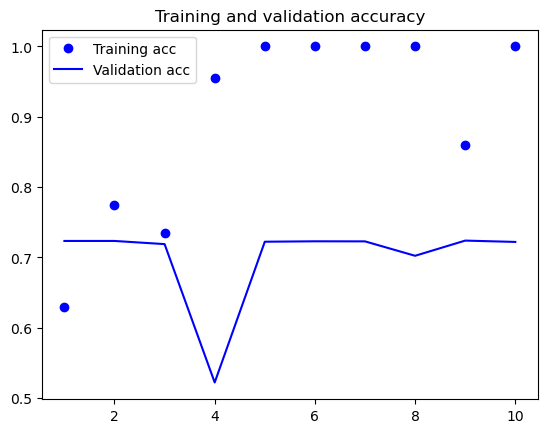

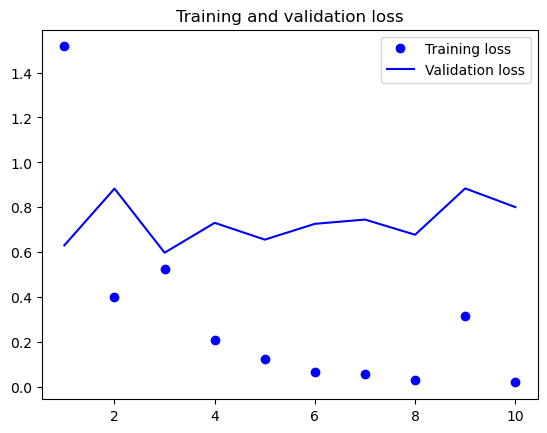

In [21]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [23]:
# -------
from keras.layers import SimpleRNN
from keras.models import Sequential
from keras.layers import Embedding, SimpleRNN

model = Sequential()
model.add(Embedding(10000, 32))
model.add(SimpleRNN(32, return_sequences=True))
model.add(SimpleRNN(32, return_sequences=True))
model.add(SimpleRNN(32, return_sequences=True))
model.add(SimpleRNN(32))  # This last layer only returns the last outputs.
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_4 (Embedding)     (None, None, 32)          320000    
                                                                 
 simple_rnn_1 (SimpleRNN)    (None, None, 32)          2080      
                                                                 
 simple_rnn_2 (SimpleRNN)    (None, None, 32)          2080      
                                                                 
 simple_rnn_3 (SimpleRNN)    (None, None, 32)          2080      
                                                                 
 simple_rnn_4 (SimpleRNN)    (None, 32)                2080      
                                                                 
Total params: 328320 (1.25 MB)
Trainable params: 328320 (1.25 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [24]:
from keras.datasets import imdb
from keras.preprocessing import sequence

max_features = 10000  # number of words to consider as features
maxlen = 500  # cut texts after this number of words (among top max_features most common words)
batch_size = 32

print('Loading data...')
(input_train, y_train), (input_test, y_test) = imdb.load_data(num_words=max_features)
print(len(input_train), 'train sequences')
print(len(input_test), 'test sequences')

print('Pad sequences (samples x time)')
input_train = sequence.pad_sequences(input_train, maxlen=maxlen)
input_test = sequence.pad_sequences(input_test, maxlen=maxlen)
print('input_train shape:', input_train.shape)
print('input_test shape:', input_test.shape)

Loading data...
25000 train sequences
25000 test sequences
Pad sequences (samples x time)
input_train shape: (25000, 500)
input_test shape: (25000, 500)


Epoch 1/10
157/157 [==============================] - 16s 97ms/step - loss: 0.6423 - acc: 0.6140 - val_loss: 0.5972 - val_acc: 0.6708
Epoch 2/10
157/157 [==============================] - 15s 97ms/step - loss: 0.4255 - acc: 0.8132 - val_loss: 0.3967 - val_acc: 0.8322
Epoch 3/10
157/157 [==============================] - 16s 102ms/step - loss: 0.3218 - acc: 0.8673 - val_loss: 0.9240 - val_acc: 0.6568
Epoch 4/10
157/157 [==============================] - 16s 105ms/step - loss: 0.2589 - acc: 0.8970 - val_loss: 0.6107 - val_acc: 0.7014
Epoch 5/10
157/157 [==============================] - 16s 103ms/step - loss: 0.2253 - acc: 0.9142 - val_loss: 0.4092 - val_acc: 0.8290
Epoch 6/10
157/157 [==============================] - 16s 103ms/step - loss: 0.1631 - acc: 0.9384 - val_loss: 0.4630 - val_acc: 0.8422
Epoch 7/10
157/157 [==============================] - 16s 100ms/step - loss: 0.1211 - acc: 0.9579 - val_loss: 0.4419 - val_acc: 0.8614
Epoch 8/10
157/157 [==============================] - 16s

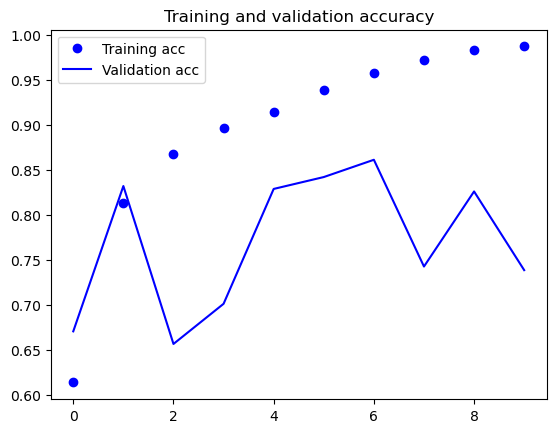

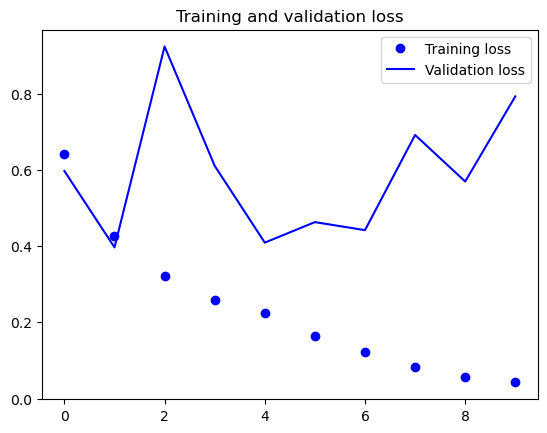

In [25]:
from keras.layers import Dense

model = Sequential()
model.add(Embedding(max_features, 32))
model.add(SimpleRNN(32))
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['acc'])
history = model.fit(input_train, y_train,
                    epochs=10,
                    batch_size=128,
                    validation_split=0.2)
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Epoch 1/10
157/157 [==============================] - 56s 349ms/step - loss: 0.5953 - acc: 0.6733 - val_loss: 0.4367 - val_acc: 0.8182
Epoch 2/10
157/157 [==============================] - 44s 280ms/step - loss: 0.3582 - acc: 0.8556 - val_loss: 0.3321 - val_acc: 0.8634
Epoch 3/10
157/157 [==============================] - 53s 338ms/step - loss: 0.2741 - acc: 0.8942 - val_loss: 0.5725 - val_acc: 0.7854
Epoch 4/10
157/157 [==============================] - 50s 319ms/step - loss: 0.2327 - acc: 0.9130 - val_loss: 0.3698 - val_acc: 0.8724
Epoch 5/10
157/157 [==============================] - 41s 262ms/step - loss: 0.2036 - acc: 0.9240 - val_loss: 0.2930 - val_acc: 0.8772
Epoch 6/10
157/157 [==============================] - 52s 329ms/step - loss: 0.1833 - acc: 0.9326 - val_loss: 0.3070 - val_acc: 0.8686
Epoch 7/10
157/157 [==============================] - 52s 328ms/step - loss: 0.1634 - acc: 0.9420 - val_loss: 0.3266 - val_acc: 0.8806
Epoch 8/10
157/157 [==============================] - 4

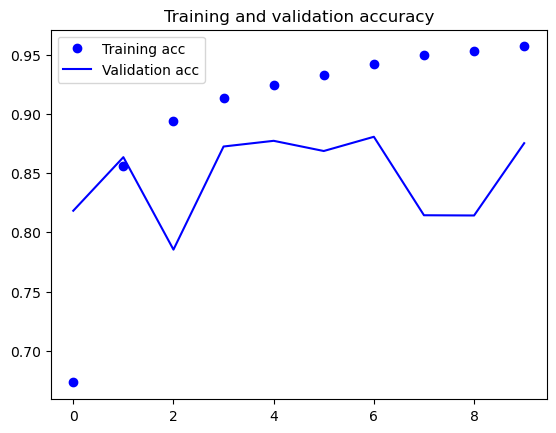

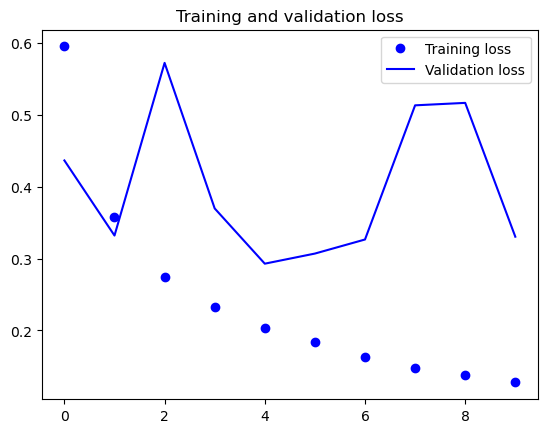

In [26]:
from keras.layers import LSTM

model = Sequential()
model.add(Embedding(max_features, 32))
model.add(LSTM(32))
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer='rmsprop',
              loss='binary_crossentropy',
              metrics=['acc'])
history = model.fit(input_train, y_train,
                    epochs=10,
                    batch_size=128,
                    validation_split=0.2)
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [27]:
# ------------
import os

data_dir = 'C:/Users/huy/Downloads/jena_climate_2009_2016.csv'
fname = os.path.join(data_dir, 'jena_climate_2009_2016.csv')

f = open(fname)
data = f.read()
f.close()

lines = data.split('\n')
header = lines[0].split(',')
lines = lines[1:]

print(header)
print(len(lines))

['"Date Time"', '"p (mbar)"', '"T (degC)"', '"Tpot (K)"', '"Tdew (degC)"', '"rh (%)"', '"VPmax (mbar)"', '"VPact (mbar)"', '"VPdef (mbar)"', '"sh (g/kg)"', '"H2OC (mmol/mol)"', '"rho (g/m**3)"', '"wv (m/s)"', '"max. wv (m/s)"', '"wd (deg)"']
420451


In [28]:
import numpy as np

float_data = np.zeros((len(lines), len(header) - 1))
for i, line in enumerate(lines):
    values = [float(x) for x in line.split(',')[1:]]
    float_data[i, :] = values

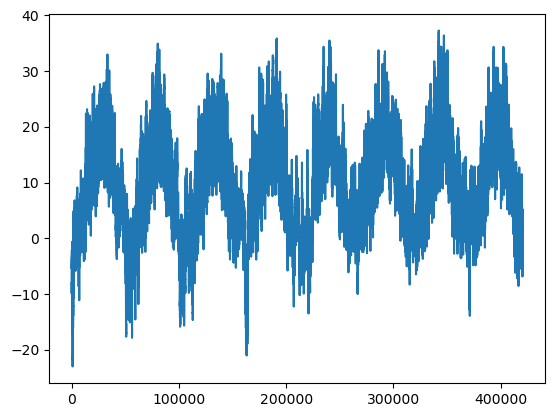

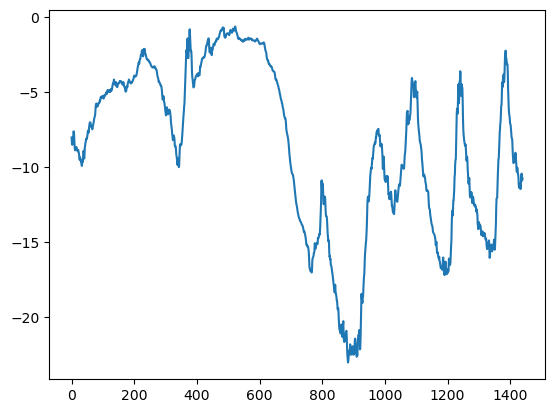

In [29]:
from matplotlib import pyplot as plt

temp = float_data[:, 1]  # temperature (in degrees Celsius)
plt.plot(range(len(temp)), temp)
plt.show()
plt.plot(range(1440), temp[:1440])
plt.show()

In [30]:
mean = float_data[:200000].mean(axis=0)
float_data -= mean
std = float_data[:200000].std(axis=0)
float_data /= std

In [35]:
def generator(data, lookback, delay, min_index, max_index,
              shuffle=False, batch_size=128, step=6):
    if max_index is None:
        max_index = len(data) - delay - 1
    i = min_index + lookback
    while 1:
        if shuffle:
            rows = np.random.randint(
                min_index + lookback, max_index, size=batch_size)
        else:
            if i + batch_size >= max_index:
                i = min_index + lookback
            rows = np.arange(i, min(i + batch_size, max_index))
            i += len(rows)

        samples = np.zeros((len(rows),
                           lookback // step,
                           data.shape[-1]))
        targets = np.zeros((len(rows),))
        for j, row in enumerate(rows):
            indices = range(rows[j] - lookback, rows[j], step)
            samples[j] = data[indices]
            targets[j] = data[rows[j] + delay][1]
        yield samples, targets

In [36]:
lookback = 1440
step = 6
delay = 144
batch_size = 128

train_gen = generator(float_data,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=200000,
                      shuffle=True,
                      step=step, 
                      batch_size=batch_size)
val_gen = generator(float_data,
                    lookback=lookback,
                    delay=delay,
                    min_index=200001,
                    max_index=300000,
                    step=step,
                    batch_size=batch_size)
test_gen = generator(float_data,
                     lookback=lookback,
                     delay=delay,
                     min_index=300001,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

# This is how many steps to draw from `val_gen`
# in order to see the whole validation set:
val_steps = (300000 - 200001 - lookback) // batch_size

# This is how many steps to draw from `test_gen`
# in order to see the whole test set:
test_steps = (len(float_data) - 300001 - lookback) // batch_size

NameError: name 'preds' is not defined

In [38]:
def evaluate_naive_method():
    batch_maes = []
    for step in range(val_steps):
        samples, targets = next(val_gen)
        preds = samples[:, -1, 1]
        mae = np.mean(np.abs(preds - targets))
        batch_maes.append(mae)
    print(np.mean(batch_maes))
    
evaluate_naive_method()

0.2897359729905486


Epoch 1/20


C:\Users\huy\AppData\Local\Temp\ipykernel_14072\1489324828.py:11: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


500/500 [==============================] - 11s 22ms/step - loss: 1.1115 - val_loss: 0.6191
Epoch 2/20
500/500 [==============================] - 11s 22ms/step - loss: 0.3696 - val_loss: 0.2943
Epoch 3/20
500/500 [==============================] - 12s 24ms/step - loss: 0.2825 - val_loss: 0.3189
Epoch 4/20
500/500 [==============================] - 11s 22ms/step - loss: 0.2634 - val_loss: 0.3022
Epoch 5/20
500/500 [==============================] - 11s 23ms/step - loss: 0.2516 - val_loss: 0.3019
Epoch 6/20
500/500 [==============================] - 11s 21ms/step - loss: 0.2419 - val_loss: 0.3059
Epoch 7/20
500/500 [==============================] - 12s 24ms/step - loss: 0.2344 - val_loss: 0.3244
Epoch 8/20
500/500 [==============================] - 12s 25ms/step - loss: 0.2303 - val_loss: 0.3214
Epoch 9/20
500/500 [==============================] - 13s 27ms/step - loss: 0.2241 - val_loss: 0.3281
Epoch 10/20
500/500 [==============================] - 12s 24ms/step - loss: 0.2205 - val_los

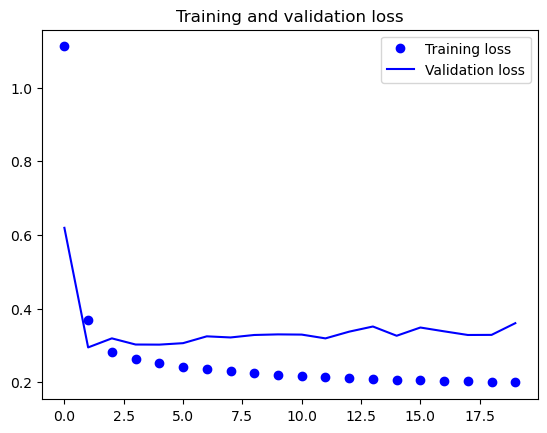

In [39]:
from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop

model = Sequential()
model.add(layers.Flatten(input_shape=(lookback // step, float_data.shape[-1])))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(1))

model.compile(optimizer=RMSprop(), loss='mae')
history = model.fit_generator(train_gen,
                              steps_per_epoch=500,
                              epochs=20,
                              validation_data=val_gen,
                              validation_steps=val_steps)
import matplotlib.pyplot as plt

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(loss))

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop

model = Sequential()
model.add(layers.GRU(32, input_shape=(None, float_data.shape[-1])))
model.add(layers.Dense(1))

model.compile(optimizer=RMSprop(), loss='mae')
history = model.fit_generator(train_gen,
                              steps_per_epoch=500,
                              epochs=20,
                              validation_data=val_gen,
                              validation_steps=val_steps)
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(loss))

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop

model = Sequential()
model.add(layers.GRU(32,
                     dropout=0.2,
                     recurrent_dropout=0.2,
                     input_shape=(None, float_data.shape[-1])))
model.add(layers.Dense(1))

model.compile(optimizer=RMSprop(), loss='mae')
history = model.fit_generator(train_gen,
                              steps_per_epoch=500,
                              epochs=40,
                              validation_data=val_gen,
                              validation_steps=val_steps)
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(loss))

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop

model = Sequential()
model.add(layers.GRU(32,
                     dropout=0.1,
                     recurrent_dropout=0.5,
                     return_sequences=True,
                     input_shape=(None, float_data.shape[-1])))
model.add(layers.GRU(64, activation='relu',
                     dropout=0.1, 
                     recurrent_dropout=0.5))
model.add(layers.Dense(1))

model.compile(optimizer=RMSprop(), loss='mae')
history = model.fit_generator(train_gen,
                              steps_per_epoch=500,
                              epochs=40,
                              validation_data=val_gen,
                              validation_steps=val_steps)
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(loss))

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [40]:
def reverse_order_generator(data, lookback, delay, min_index, max_index,
                            shuffle=False, batch_size=128, step=6):
    if max_index is None:
        max_index = len(data) - delay - 1
    i = min_index + lookback
    while 1:
        if shuffle:
            rows = np.random.randint(
                min_index + lookback, max_index, size=batch_size)
        else:
            if i + batch_size >= max_index:
                i = min_index + lookback
            rows = np.arange(i, min(i + batch_size, max_index))
            i += len(rows)

        samples = np.zeros((len(rows),
                           lookback // step,
                           data.shape[-1]))
        targets = np.zeros((len(rows),))
        for j, row in enumerate(rows):
            indices = range(rows[j] - lookback, rows[j], step)
            samples[j] = data[indices]
            targets[j] = data[rows[j] + delay][1]
        yield samples[:, ::-1, :], targets
        
train_gen_reverse = reverse_order_generator(
    float_data,
    lookback=lookback,
    delay=delay,
    min_index=0,
    max_index=200000,
    shuffle=True,
    step=step, 
    batch_size=batch_size)
val_gen_reverse = reverse_order_generator(
    float_data,
    lookback=lookback,
    delay=delay,
    min_index=200001,
    max_index=300000,
    step=step,
    batch_size=batch_size)

In [41]:
model = Sequential()
model.add(layers.GRU(32, input_shape=(None, float_data.shape[-1])))
model.add(layers.Dense(1))

model.compile(optimizer=RMSprop(), loss='mae')
history = model.fit_generator(train_gen_reverse,
                              steps_per_epoch=500,
                              epochs=20,
                              validation_data=val_gen_reverse,
                              validation_steps=val_steps)
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(loss))

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Epoch 1/20


C:\Users\huy\AppData\Local\Temp\ipykernel_14072\2901465589.py:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen_reverse,


408/500 [=======================>......] - ETA: 8s - loss: 0.4835

KeyboardInterrupt: 

In [42]:
from keras.datasets import imdb
from keras.preprocessing import sequence
from keras import layers
from keras.models import Sequential

# Number of words to consider as features
max_features = 10000
# Cut texts after this number of words (among top max_features most common words)
maxlen = 500

# Load data
(x_train, y_train), (x_test, y_test) = imdb.load_data(num_words=max_features)

# Reverse sequences
x_train = [x[::-1] for x in x_train]
x_test = [x[::-1] for x in x_test]

# Pad sequences
x_train = sequence.pad_sequences(x_train, maxlen=maxlen)
x_test = sequence.pad_sequences(x_test, maxlen=maxlen)

model = Sequential()
model.add(layers.Embedding(max_features, 128))
model.add(layers.LSTM(32))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer='rmsprop',
              loss='binary_crossentropy',
              metrics=['acc'])
history = model.fit(x_train, y_train,
                    epochs=10,
                    batch_size=128,
                    validation_split=0.2)

Epoch 1/10
 33/157 [=====>........................] - ETA: 41s - loss: 0.6918 - acc: 0.5192

KeyboardInterrupt: 

In [ ]:
from keras import backend as K
K.clear_session()

model = Sequential()
model.add(layers.Embedding(max_features, 32))
model.add(layers.Bidirectional(layers.LSTM(32)))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['acc'])
history = model.fit(x_train, y_train, epochs=10, batch_size=128, validation_split=0.2)

In [ ]:
from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop

model = Sequential()
model.add(layers.Bidirectional(
    layers.GRU(32), input_shape=(None, float_data.shape[-1])))
model.add(layers.Dense(1))

model.compile(optimizer=RMSprop(), loss='mae')
history = model.fit_generator(train_gen,
                              steps_per_epoch=500,
                              epochs=40,
                              validation_data=val_gen,
                              validation_steps=val_steps)

In [43]:
# --------------
from keras.datasets import imdb
from keras.preprocessing import sequence

max_features = 10000  # number of words to consider as features
max_len = 500  # cut texts after this number of words (among top max_features most common words)

print('Loading data...')
(x_train, y_train), (x_test, y_test) = imdb.load_data(num_words=max_features)
print(len(x_train), 'train sequences')
print(len(x_test), 'test sequences')

print('Pad sequences (samples x time)')
x_train = sequence.pad_sequences(x_train, maxlen=max_len)
x_test = sequence.pad_sequences(x_test, maxlen=max_len)
print('x_train shape:', x_train.shape)
print('x_test shape:', x_test.shape)

Loading data...
25000 train sequences
25000 test sequences
Pad sequences (samples x time)
x_train shape: (25000, 500)
x_test shape: (25000, 500)


Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_8 (Embedding)     (None, 500, 128)          1280000   
                                                                 
 conv1d (Conv1D)             (None, 494, 32)           28704     
                                                                 
 max_pooling1d (MaxPooling1  (None, 98, 32)            0         
 D)                                                              
                                                                 
 conv1d_1 (Conv1D)           (None, 92, 32)            7200      
                                                                 
 global_max_pooling1d (Glob  (None, 32)                0         
 alMaxPooling1D)                                                 
                                                                 
 dense_9 (Dense)             (None, 1)                

Epoch 1/10
157/157 [==============================] - 47s 293ms/step - loss: 0.5914 - acc: 0.6899 - val_loss: 0.4340 - val_acc: 0.8356
Epoch 2/10
157/157 [==============================] - 43s 275ms/step - loss: 0.3930 - acc: 0.8691 - val_loss: 0.5039 - val_acc: 0.8364
Epoch 3/10
157/157 [==============================] - 40s 256ms/step - loss: 0.3243 - acc: 0.9047 - val_loss: 0.4862 - val_acc: 0.8664
Epoch 4/10
157/157 [==============================] - 41s 264ms/step - loss: 0.2840 - acc: 0.9305 - val_loss: 0.5837 - val_acc: 0.8734
Epoch 5/10
157/157 [==============================] - 43s 277ms/step - loss: 0.2282 - acc: 0.9557 - val_loss: 0.6973 - val_acc: 0.8700
Epoch 6/10
157/157 [==============================] - 39s 251ms/step - loss: 0.1820 - acc: 0.9715 - val_loss: 0.8176 - val_acc: 0.8692
Epoch 7/10
157/157 [==============================] - 43s 276ms/step - loss: 0.1554 - acc: 0.9794 - val_loss: 1.0746 - val_acc: 0.8508
Epoch 8/10
157/157 [==============================] - 5

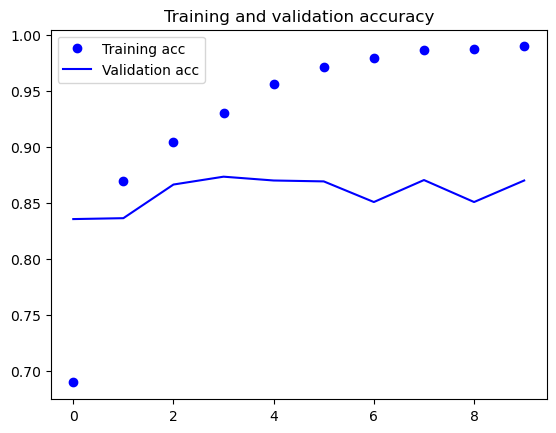

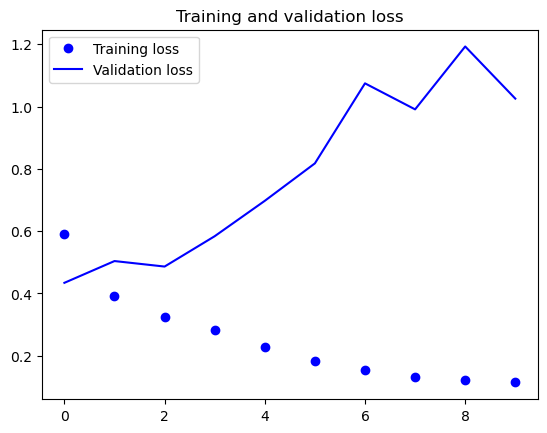

In [44]:
from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop

model = Sequential()
model.add(layers.Embedding(max_features, 128, input_length=max_len))
model.add(layers.Conv1D(32, 7, activation='relu'))
model.add(layers.MaxPooling1D(5))
model.add(layers.Conv1D(32, 7, activation='relu'))
model.add(layers.GlobalMaxPooling1D())
model.add(layers.Dense(1))

model.summary()

model.compile(optimizer=RMSprop(lr=1e-4),
              loss='binary_crossentropy',
              metrics=['acc'])
history = model.fit(x_train, y_train,
                    epochs=10,
                    batch_size=128,
                    validation_split=0.2)
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [45]:
import os
import numpy as np

data_dir = 'C:/Users/huy/Downloads/jena_climate_2009_2016.csv'
fname = os.path.join(data_dir, 'jena_climate_2009_2016.csv')

f = open(fname)
data = f.read()
f.close()

lines = data.split('\n')
header = lines[0].split(',')
lines = lines[1:]

float_data = np.zeros((len(lines), len(header) - 1))
for i, line in enumerate(lines):
    values = [float(x) for x in line.split(',')[1:]]
    float_data[i, :] = values
    
mean = float_data[:200000].mean(axis=0)
float_data -= mean
std = float_data[:200000].std(axis=0)
float_data /= std

def generator(data, lookback, delay, min_index, max_index,
              shuffle=False, batch_size=128, step=6):
    if max_index is None:
        max_index = len(data) - delay - 1
    i = min_index + lookback
    while 1:
        if shuffle:
            rows = np.random.randint(
                min_index + lookback, max_index, size=batch_size)
        else:
            if i + batch_size >= max_index:
                i = min_index + lookback
            rows = np.arange(i, min(i + batch_size, max_index))
            i += len(rows)

        samples = np.zeros((len(rows),
                           lookback // step,
                           data.shape[-1]))
        targets = np.zeros((len(rows),))
        for j, row in enumerate(rows):
            indices = range(rows[j] - lookback, rows[j], step)
            samples[j] = data[indices]
            targets[j] = data[rows[j] + delay][1]
        yield samples, targets
        
lookback = 1440
step = 6
delay = 144
batch_size = 128

train_gen = generator(float_data,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=200000,
                      shuffle=True,
                      step=step, 
                      batch_size=batch_size)
val_gen = generator(float_data,
                    lookback=lookback,
                    delay=delay,
                    min_index=200001,
                    max_index=300000,
                    step=step,
                    batch_size=batch_size)
test_gen = generator(float_data,
                     lookback=lookback,
                     delay=delay,
                     min_index=300001,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

# This is how many steps to draw from `val_gen`
# in order to see the whole validation set:
val_steps = (300000 - 200001 - lookback) // batch_size

# This is how many steps to draw from `test_gen`
# in order to see the whole test set:
test_steps = (len(float_data) - 300001 - lookback) // batch_size

In [46]:
from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop

model = Sequential()
model.add(layers.Conv1D(32, 5, activation='relu',
                        input_shape=(None, float_data.shape[-1])))
model.add(layers.MaxPooling1D(3))
model.add(layers.Conv1D(32, 5, activation='relu'))
model.add(layers.MaxPooling1D(3))
model.add(layers.Conv1D(32, 5, activation='relu'))
model.add(layers.GlobalMaxPooling1D())
model.add(layers.Dense(1))

model.compile(optimizer=RMSprop(), loss='mae')
history = model.fit_generator(train_gen,
                              steps_per_epoch=500,
                              epochs=20,
                              validation_data=val_gen,
                              validation_steps=val_steps)
import matplotlib.pyplot as plt

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(loss))

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Epoch 1/20


C:\Users\huy\AppData\Local\Temp\ipykernel_14072\2523670029.py:16: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


500/500 [==============================] - 26s 50ms/step - loss: 0.4132 - val_loss: 0.4364
Epoch 2/20
500/500 [==============================] - 28s 56ms/step - loss: 0.3580 - val_loss: 0.4466
Epoch 3/20
500/500 [==============================] - ETA: 0s - loss: 0.3365

KeyboardInterrupt: 

In [ ]:
step = 3
lookback = 720  # Unchanged
delay = 144 # Unchanged

train_gen = generator(float_data,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=200000,
                      shuffle=True,
                      step=step)
val_gen = generator(float_data,
                    lookback=lookback,
                    delay=delay,
                    min_index=200001,
                    max_index=300000,
                    step=step)
test_gen = generator(float_data,
                     lookback=lookback,
                     delay=delay,
                     min_index=300001,
                     max_index=None,
                     step=step)
val_steps = (300000 - 200001 - lookback) // 128
test_steps = (len(float_data) - 300001 - lookback) // 128
model = Sequential()
model.add(layers.Conv1D(32, 5, activation='relu',
                        input_shape=(None, float_data.shape[-1])))
model.add(layers.MaxPooling1D(3))
model.add(layers.Conv1D(32, 5, activation='relu'))
model.add(layers.GRU(32, dropout=0.1, recurrent_dropout=0.5))
model.add(layers.Dense(1))

model.summary()

model.compile(optimizer=RMSprop(), loss='mae')
history = model.fit_generator(train_gen,
                              steps_per_epoch=500,
                              epochs=20,
                              validation_data=val_gen,
                              validation_steps=val_steps)
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(loss))

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()